In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import torch

# GPU 사용 가능 -> True, GPU 사용 불가 -> False
print(torch.cuda.is_available())

True


In [3]:
!pip install transformers[torch]
!pip install datasets
!pip install accelerate -U

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.6/302.6 kB 4.6 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-m

In [4]:
import pandas as pd
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    Trainer,
    TrainingArguments,
    DataCollatorWithPadding
)
from datasets import Dataset
from sklearn.model_selection import train_test_split

In [5]:
# Load the dataset
dataset_url = '/content/drive/MyDrive/deeplearning/kmhas_dataset.txt'
data = pd.read_csv(dataset_url, sep='\t')

In [6]:
# Merge labels
label_columns = ['출신차별', '외모차별', '정치성향차별', '혐오욕설', '연령차별', '성차별', '인종차별', '종교차별', '해당사항 없음']
data['multi_class_label'] = data[label_columns].idxmax(axis=1)

In [7]:
# Encode Label & Make label column
id2label = {k:v for k, v in enumerate(data['multi_class_label'].unique())}
label2id = {v:k for k, v in id2label.items()}

data['labels'] = data['multi_class_label'].map(label2id)

In [8]:
# Split and Make Dataset
train_data, temp_data = train_test_split(data, test_size=0.2, random_state=42)
val_data, test_data = train_test_split(temp_data, test_size=0.5, random_state=42)

train_dataset = Dataset.from_dict(train_data)
val_dataset = Dataset.from_dict(val_data)
test_dataset = Dataset.from_dict(test_data)

In [9]:
# Tokenize Dataset
tokenizer = AutoTokenizer.from_pretrained('snunlp/KR-BERT-char16424')
def tokenize_data(data):
    encoded = tokenizer(
        data['document'],
        truncation=True
    )
    encoded['labels'] = data['labels']
    return encoded

tokenized_train_dataset = train_dataset.map(tokenize_data, batched=True)
tokenized_val_dataset = val_dataset.map(tokenize_data, batched=True)
tokenized_test_dataset = test_dataset.map(tokenize_data, batched=True)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/104k [00:00<?, ?B/s]

Map:   0%|          | 0/87753 [00:00<?, ? examples/s]

Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.


Map:   0%|          | 0/10969 [00:00<?, ? examples/s]

Map:   0%|          | 0/10970 [00:00<?, ? examples/s]

In [10]:
# Load Collator
collator = DataCollatorWithPadding(
    tokenizer=tokenizer,
    padding='longest'    # pad to longest sequence in batch
)

In [11]:
# Function to compute metrics
import numpy as np
from sklearn.metrics import accuracy_score, f1_score

def compute_metrics(p):
    preds = np.argmax(p.predictions, axis=1)
    accuracy = accuracy_score(p.label_ids, preds)
    f1 = f1_score(p.label_ids, preds, average='weighted')
    return {'accuracy': accuracy, 'f1': f1}

In [12]:
# Load arguments
training_args = TrainingArguments(
        output_dir='./results',
        num_train_epochs=2,
        weight_decay=.01,
        per_device_train_batch_size=16,
        per_device_eval_batch_size=16,
        learning_rate=3e-5,
        evaluation_strategy='steps',
        eval_steps=300,
        save_strategy='steps',
        save_steps=300,
        logging_strategy='steps',
        logging_steps=500,
        save_total_limit=1,
        load_best_model_at_end=True,
        metric_for_best_model='eval_f1',
        greater_is_better=True,
        lr_scheduler_type='cosine',
        warmup_ratio=0.1,
        no_cuda=False

    )

/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1474: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


In [13]:
# Load & Train model

model = AutoModelForSequenceClassification.from_pretrained('snunlp/KR-BERT-char16424', id2label=id2label, label2id=label2id)
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=tokenized_train_dataset,
    eval_dataset=tokenized_val_dataset,
    data_collator=collator,
    compute_metrics=compute_metrics
)

trainer.train()

pytorch_model.bin:   0%|          | 0.00/397M [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at snunlp/KR-BERT-char16424 and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Step,Training Loss,Validation Loss,Accuracy,F1
300,No log,1.336398,0.573799,0.465483
600,1.532200,0.935747,0.707084,0.664459
900,1.532200,0.695889,0.761236,0.756643
1200,0.856300,0.652759,0.781931,0.777798
1500,0.683100,0.589119,0.801532,0.797237
1800,0.683100,0.563509,0.808096,0.805619
2100,0.590200,0.539890,0.811104,0.809360
2400,0.590200,0.574257,0.805999,0.797574
2700,0.571600,0.526729,0.815662,0.812734
3000,0.522900,0.554782,0.816392,0.808723


TrainOutput(global_step=10970, training_loss=0.49265469435463194, metrics={'train_runtime': 4602.3996, 'train_samples_per_second': 38.134, 'train_steps_per_second': 2.384, 'total_flos': 6159653500318956.0, 'train_loss': 0.49265469435463194, 'epoch': 2.0})

In [14]:
# Evaluate the final model on the test set
test_results = trainer.evaluate(tokenized_test_dataset)

print(f"Test Accuracy: {test_results['eval_accuracy']}")
print(f"Test F1 Score: {test_results['eval_f1']}")

Test Accuracy: 0.8540565177757521
Test F1 Score: 0.8534746023866134


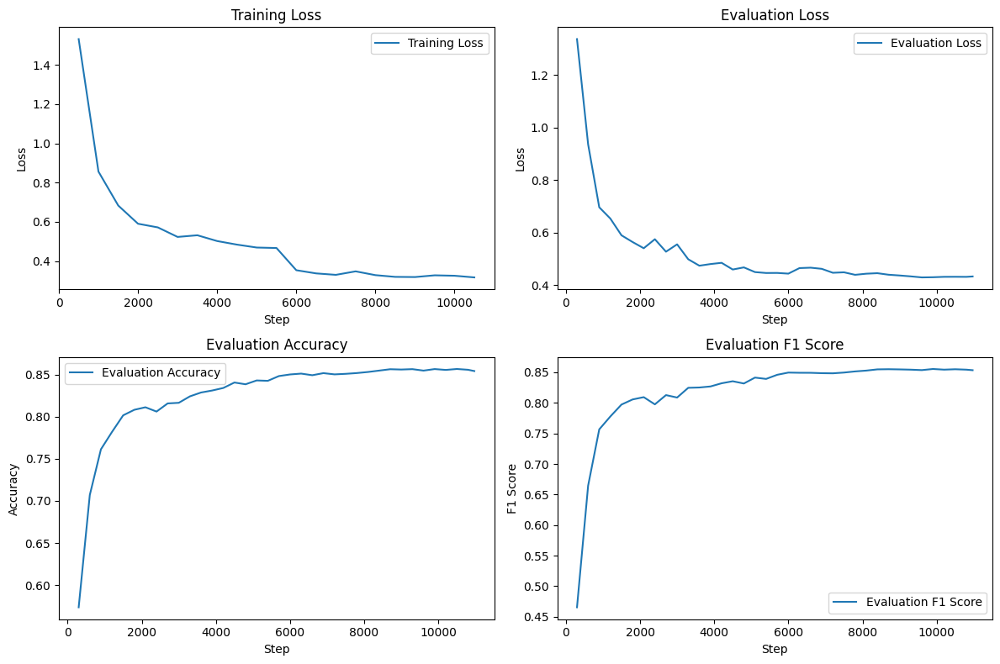

In [15]:
import matplotlib.pyplot as plt

# Fetching metrics from the trainer's logs
log_history = trainer.state.log_history

# Extracting values for plotting
train_steps = []
train_loss = []
eval_steps = []
eval_loss = []
eval_accuracy = []
eval_f1 = []

for entry in log_history:
    if 'loss' in entry and 'step' in entry:
        train_steps.append(entry['step'])
        train_loss.append(entry['loss'])
    elif 'eval_loss' in entry:
        eval_steps.append(entry['step'])  # Ensure steps are logged with eval metrics
        eval_loss.append(entry['eval_loss'])
        eval_accuracy.append(entry['eval_accuracy'])
        eval_f1.append(entry['eval_f1'])

# Creating the plots
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(train_steps, train_loss, label='Training Loss')
plt.xlabel('Step')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(eval_steps, eval_loss, label='Evaluation Loss')  # Use eval_steps here
plt.xlabel('Step')
plt.ylabel('Loss')
plt.title('Evaluation Loss')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(eval_steps, eval_accuracy, label='Evaluation Accuracy')  # Use eval_steps here
plt.xlabel('Step')
plt.ylabel('Accuracy')
plt.title('Evaluation Accuracy')
plt.legend()

plt.subplot(2, 2, 4)
plt.plot(eval_steps, eval_f1, label='Evaluation F1 Score')  # Use eval_steps here
plt.xlabel('Step')
plt.ylabel('F1 Score')
plt.title('Evaluation F1 Score')
plt.legend()

plt.tight_layout()
plt.show()

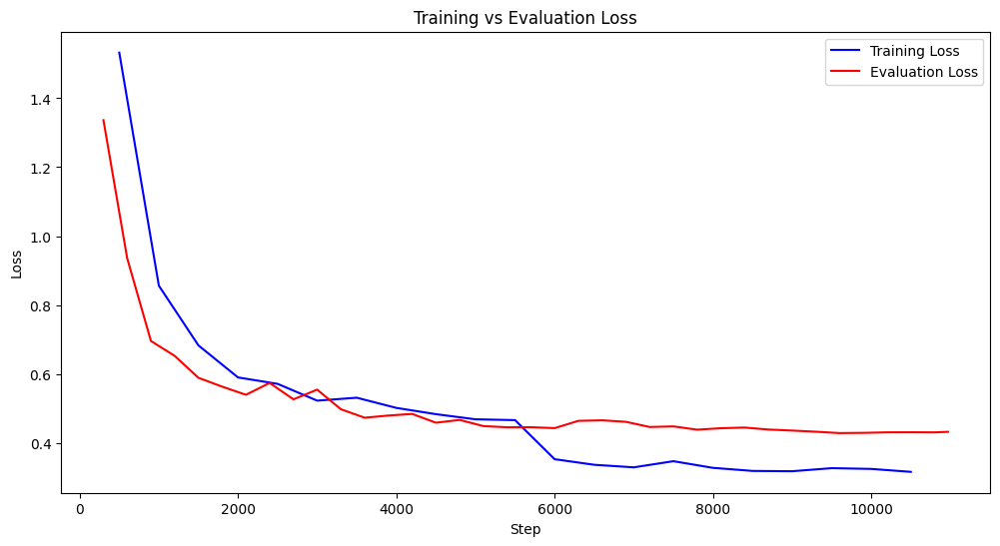

In [16]:
import matplotlib.pyplot as plt

# Fetching metrics from the trainer's logs
log_history = trainer.state.log_history

# Extracting values for plotting
train_steps = []
train_loss = []
eval_steps = []
eval_loss = []
eval_accuracy = []
eval_f1 = []

for entry in log_history:
    if 'loss' in entry and 'step' in entry:
        train_steps.append(entry['step'])
        train_loss.append(entry['loss'])
    elif 'eval_loss' in entry:
        eval_steps.append(entry['step'])  # Ensure steps are logged with eval metrics
        eval_loss.append(entry['eval_loss'])
        eval_accuracy.append(entry['eval_accuracy'])
        eval_f1.append(entry['eval_f1'])

# Plotting Loss (Training and Evaluation on the same graph)
plt.figure(figsize=(12, 6))

plt.plot(train_steps, train_loss, label='Training Loss', color='blue')
plt.plot(eval_steps, eval_loss, label='Evaluation Loss', color='red')
plt.xlabel('Step')
plt.ylabel('Loss')
plt.title('Training vs Evaluation Loss')
plt.legend()


In [17]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=89f1fbe7ecde75e63f3bbeb39ef460ea1d542605a3469064ab0d171487b9c7fa
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [18]:
from lime.lime_text import LimeTextExplainer
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.font_manager as fm
import torch
import re

In [19]:
# 모델을 GPU로 이동
model = model.to('cuda')

# predict_proba 함수 수정
def predict_proba(texts):
    # 텍스트를 리스트로 받아 한 번에 처리
    encoded_texts = tokenizer(texts, truncation=True, padding=True, return_tensors='pt', max_length=512)
    encoded_texts = {k: v.to('cuda') for k, v in encoded_texts.items()}
    with torch.no_grad():
        outputs = model(**encoded_texts)
    predictions = torch.nn.functional.softmax(outputs.logits, dim=-1)
    return predictions.to('cpu').numpy()

# LIME 설명 생성기를 멀티 클래스 라벨에 맞게 초기화
class_names = ['출신차별', '외모차별', '정치성향차별', '혐오욕설', '연령차별', '성차별', '인종차별', '종교차별', '해당사항 없음']
explainer = LimeTextExplainer(class_names=class_names)

# 샘플 텍스트 선택
idx = 0
sample_text = test_data.iloc[idx]['document']  # '문장' 열을 사용

# LIME 설명 생성
exp = explainer.explain_instance(sample_text, predict_proba, num_features=6, labels=range(len(class_names)))
exp.show_in_notebook(text=True)
# Jupyter Notebook 이외의 환경에서 설명 출력
print(exp.as_list())

[('잊을수', 0.003838822360543999), ('없는', -0.002020984016429666), ('걸그룹', -0.0019565559693505204), ('레전드', 0.0004364414345538435), ('원더걸스', -0.0001919797186636886)]


In [21]:
random_indices = np.random.choice(test_data.index, size=5, replace=False)
for idx in random_indices:
    sample_text = test_data.loc[idx]['document']
    # LIME을 사용하여 예측 설명 생성
    exp = explainer.explain_instance(sample_text, predict_proba, num_features=6,labels=range(len(class_names)))
    # 설명 출력 (Jupyter Notebook에서 사용 가능)
    exp.show_in_notebook(text=True)